In [15]:
from os import path


import numpy as np
import pandas as pd
from scipy import signal, interpolate
from scipy.spatial.distance import cdist
from scipy.stats import pearsonr

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import folium

import keras


Input definitions

valid:
$$a < \gamma_\text{th} v^4$$

In [187]:
source_path = r"C:\Users\joses\Mi unidad\TRABAJO\49_profile_estimation\TRABAJO\spectrogram_based\datasets\metrotranvia"

win_len = 100

gamma_th_mask = .00001 # [A]/(m4/s4)
v_th_mask = 0.0 # m/s

flim = (0, 25)  # Hz

Data extraction

In [188]:
def load_dataset_n(source_path: str, path_n: str, t_ini: float, t_fin: float, n_dataset: int = 0, subtract_g: float = 0):
    loc_orig_df_n = pd.read_csv(path.join(source_path, path_n, "Location.csv"))
    acc_orig_df_n = pd.read_csv(path.join(source_path, path_n, "Accelerometer.csv"))

    t_ini_loc, t_fin_loc = loc_orig_df_n['seconds_elapsed'][0], loc_orig_df_n['seconds_elapsed'].iloc[-1]
    t_ini_acc, t_fin_acc = acc_orig_df_n['seconds_elapsed'][0], acc_orig_df_n['seconds_elapsed'].iloc[-1]
    print(f"{t_ini_acc=}, {t_fin_acc=}; {t_ini_loc=}, {t_fin_loc=}")

    loc_orig_df_n = loc_orig_df_n.loc[loc_orig_df_n['seconds_elapsed'] >= t_ini].loc[loc_orig_df_n['seconds_elapsed'] <= t_fin].reset_index()
    acc_orig_df_n = acc_orig_df_n.loc[acc_orig_df_n['seconds_elapsed'] >= t_ini].loc[acc_orig_df_n['seconds_elapsed'] <= t_fin].reset_index()
    
    t_ini_loc, t_fin_loc = loc_orig_df_n['seconds_elapsed'][0], loc_orig_df_n['seconds_elapsed'].iloc[-1]
    t_ini_acc, t_fin_acc = acc_orig_df_n['seconds_elapsed'][0], acc_orig_df_n['seconds_elapsed'].iloc[-1]
    print(f"{t_ini_acc=}, {t_fin_acc=}; {t_ini_loc=}, {t_fin_loc=}")

    acc_orig_df_n['z'] = acc_orig_df_n['z'] + subtract_g*9.81

    map = folium.Map(location=[loc_orig_df_n['latitude'].iloc[0], loc_orig_df_n['longitude'].iloc[0]], zoom_start=14)
    folium.PolyLine(list(zip(loc_orig_df_n['latitude'], loc_orig_df_n['longitude'])), color="blue", weight=2.5, opacity=1, popup=f'dataset_{n_dataset}').add_to(map)

    return loc_orig_df_n, acc_orig_df_n, map

In [189]:
# Load original dataset
t_ini, t_fin = 50, 1535 # s
loc_orig_df, acc_orig_df, map = load_dataset_n(source_path, '1', t_ini, t_fin, 1)

display(map)

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=acc_orig_df['seconds_elapsed'], 
    y=acc_orig_df['z'],
    mode='lines',
    name='acc_z'
))
fig.add_trace(go.Scatter(
    x=loc_orig_df['seconds_elapsed'], 
    y=loc_orig_df['speed'],
    mode='lines',
    name='speed'
))
fig.add_trace(go.Scatter(
    x=loc_orig_df['seconds_elapsed'], 
    y=v_th_mask*(loc_orig_df['speed']/loc_orig_df['speed']),
    mode='lines',
    name='speed threshold'
))
fig.update_layout(
    xaxis=dict(title='seconds elapsed'),
    legend=dict(title='Legend')
)
fig.show()

t_ini_acc=0.168568115234375, t_fin_acc=1537.980419921875; t_ini_loc=0.446, t_fin_loc=1537.7900778808594
t_ini_acc=50.0079921875, t_fin_acc=1534.995404296875; t_ini_loc=50.79351782226563, t_fin_loc=1533.7901416015625


Temporal spectrogram of output (car acceleration)

$$\mathrm{PSD}_\mathrm{out}(f, t) \approx S_{xx, \mathrm{out}}(f, t)$$

In [190]:
def plot_spectrogram(spectrogram_, ax=None, fig=None, tlim=None, flim=None, title=None, spatial=False, x_index=False,
                     v_min_max=None, period=False):
    f, t, Sxx = spectrogram_
    if x_index:
        t = np.arange(len(t))
    if ax is None:
        fig, ax = plt.subplots(figsize=(20, 5))
    if v_min_max:
        im = ax.pcolormesh(t, f, Sxx, shading=None, cmap='hot', vmin=v_min_max[0], vmax=v_min_max[1])
    else:
        im = ax.pcolormesh(t, f, Sxx, shading=None, cmap='hot')
    ax.set_ylabel(('Frequency [Hz]' if not spatial else 'Spatial frequency [1/m]') if not period else 
                  ('Period [s]' if not spatial else 'Wavelength [m]'))
    ax.set_xlabel('Time [s]' if not x_index else 'Sample index')
    fig.colorbar(im, ax=ax)
    if tlim is not None:
        ax.set_xlim(tlim)
    if flim is not None:
        ax.set_ylim(flim)
    ax.set_title(title if title else 'Spectrogram')

    return ax


def get_spectrogram(acc_orig_df_n, fs, win_len, tv: np.ndarray, v_th_mask: float = 0.0, gamma_th_mask: float = np.inf):
    # Compute the spectrogram
    f, t, Sxx = signal.spectrogram(acc_orig_df_n['z'], fs=fs, nperseg=win_len, noverlap=0)
    # Correct the time vector using seconds_elapsed
    t = np.interp(t, np.linspace(t[0], t[-1], len(acc_orig_df_n['seconds_elapsed'])), acc_orig_df_n['seconds_elapsed'])

    speeds = np.array([np.interp(t_, tv[:,0], tv[:,1]) for t_ in t])

    mask = np.ones(Sxx.shape)

    for i, t_ in enumerate(t):
        v = speeds[i]
        if v < v_th_mask:
            mask[:, i] = np.nan
            
    mask[Sxx >= gamma_th_mask*(speeds**4)] = np.nan

    Sxx = Sxx * mask

    return (f, t, Sxx), mask

100.0


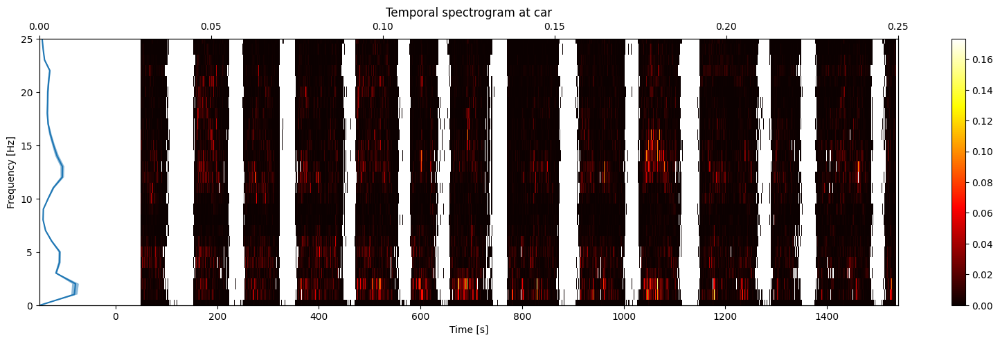

In [191]:
fs_acc = 1/(np.round(np.mean(np.diff(acc_orig_df['seconds_elapsed'].values)), 2))
print(fs_acc)

spectrogram, mask = get_spectrogram(
    acc_orig_df, fs=fs_acc, win_len=win_len, 
    tv=loc_orig_df[['seconds_elapsed', 'speed']].values,
    v_th_mask=v_th_mask,
    gamma_th_mask=gamma_th_mask
    )

global_spectrum_mean = np.nanmean(spectrogram[2], axis=1).reshape((-1, 1))
global_spectrum_std = np.nanstd(spectrogram[2], axis=1).reshape((-1, 1))
global_spectrum_sem = global_spectrum_std / np.sqrt(spectrogram[1].shape[0])
global_spectrum_l = global_spectrum_mean - 1.96*global_spectrum_sem
global_spectrum_u = global_spectrum_mean + 1.96*global_spectrum_sem

# 95% CI: +- 1.96 standar_error_mean
tmax = 1540
tlim = (-150, tmax)
ax = plot_spectrogram(spectrogram, tlim=tlim, flim=flim, title='Temporal spectrogram at car')
ax_twiny = ax.twiny()
ax_twiny.plot(global_spectrum_mean, spectrogram[0])
ax_twiny.fill_betweenx(spectrogram[0], global_spectrum_l.flatten(), global_spectrum_u.flatten(), alpha=0.5)
ax_twiny.set_xlim(-.0,.25)
plt.show()

Approximate input (wheel acceleration at wheel-rail interface)

$$ |H(f)|^2 \approx S_{\mathrm{out, mean}}(f) = \frac{1}{N}\sum_{i=1}^{N}{S(f, t_i)}$$
$$ S_{\mathrm{in}}(f, t) \approx \frac{S_{\mathrm{out}}(f, t)}{S_{\mathrm{out, mean}}(f)} $$

$$S_{\mathrm{out, mean}}(f)$$


Car speed compensation

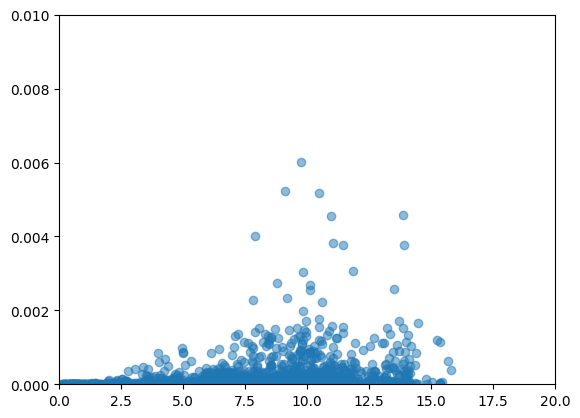

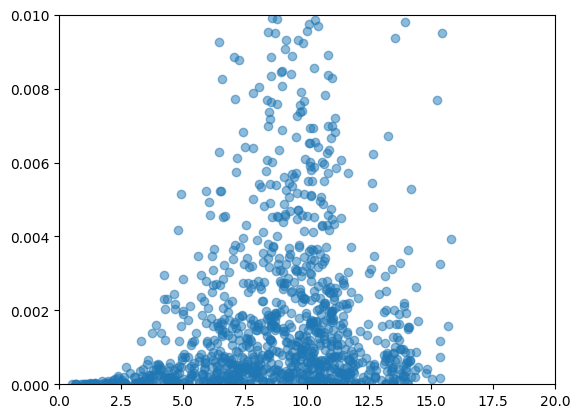

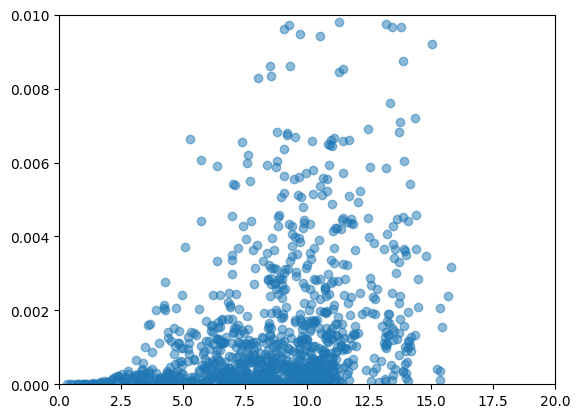

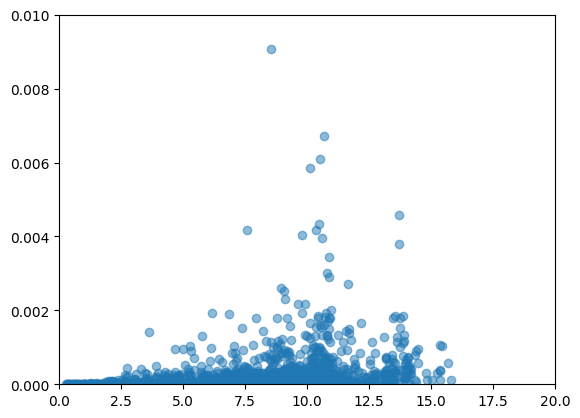

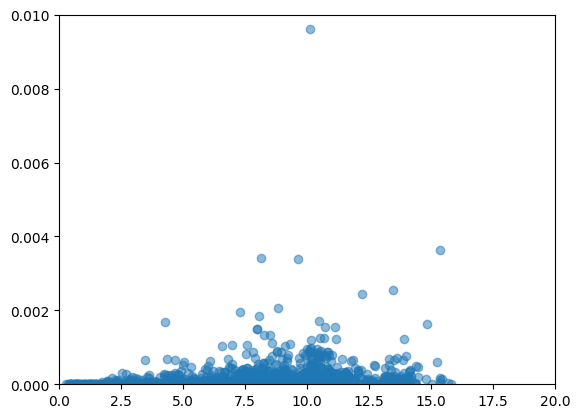

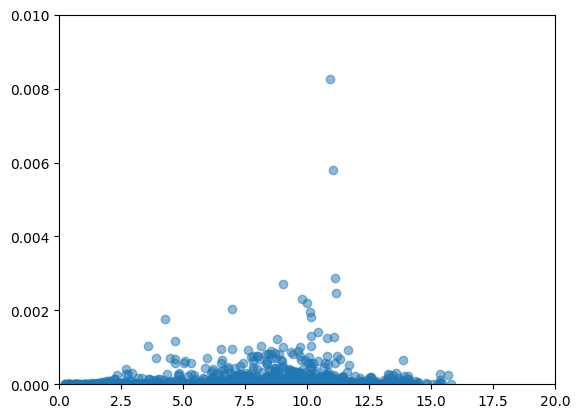

In [192]:
n_freqs = 10
f, t, S = spectrogram
tv = loc_orig_df[['seconds_elapsed', 'speed']].values
speeds = np.array([np.interp(t_, tv[:,0], tv[:,1]) for t_ in t])

th = 100
vlim = 0, 20
alim = 0, 1e-2
for i_freq in range(0, len(f), n_freqs):
        # print(i_freq)
    ax = plt.subplot()
    ax.plot(speeds[speeds <= th], S[i_freq, :][speeds <= th], linestyle='none', marker='o', alpha=0.5)
    ax.set_xlim(vlim)
    ax.set_ylim(alim)
    plt.show()

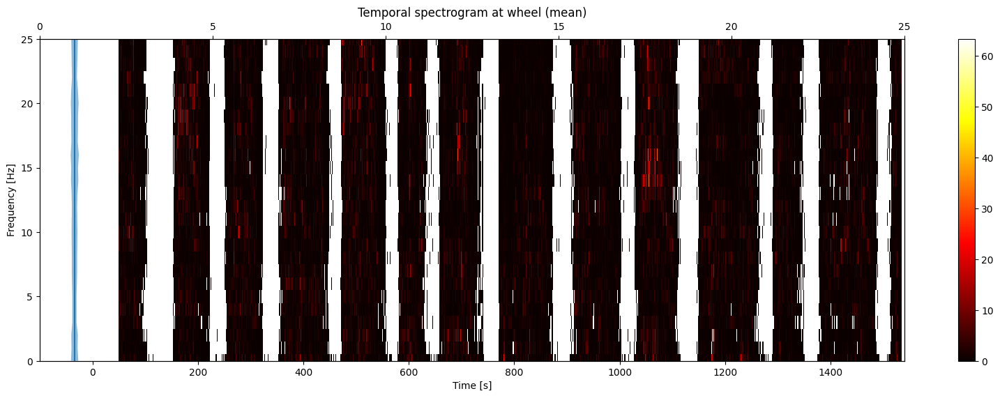

In [193]:
spectrogram_in_mean = spectrogram[0], spectrogram[1], spectrogram[2]/global_spectrum_mean
spectrogram_in_u = spectrogram[0], spectrogram[1], spectrogram[2]/global_spectrum_l
spectrogram_in_l = spectrogram[0], spectrogram[1], spectrogram[2]/global_spectrum_u
spectrogram_in_lu_size = spectrogram[0], spectrogram[1], spectrogram_in_u[2] - spectrogram_in_l[2]
spectrogram_in_lu_size_rel = spectrogram[0], spectrogram[1], spectrogram_in_lu_size[2] / spectrogram_in_mean[2]

global_spectrum_in_mean = np.nanmean(spectrogram_in_mean[2], axis=1).reshape((-1, 1))
global_spectrum_in_l = np.nanmean(spectrogram_in_l[2], axis=1).reshape((-1, 1))
global_spectrum_in_u = np.nanmean(spectrogram_in_u[2], axis=1).reshape((-1, 1))

tmax = 1540
tlim = (-100, tmax)
fig, ax2 = plt.subplots(1,1, figsize=(20,6))

ax = plot_spectrogram(spectrogram_in_mean, tlim=tlim, flim=flim, v_min_max=[0, np.nanmax(spectrogram_in_mean[2].flatten())],
                      fig=fig, ax=ax2, title='Temporal spectrogram at wheel (mean)')

ax_twiny = ax.twiny()
ax_twiny.plot(global_spectrum_in_mean, spectrogram_in_mean[0])
ax_twiny.fill_betweenx(spectrogram[0], global_spectrum_in_l.flatten(), global_spectrum_in_u.flatten(), alpha=0.5)
ax_twiny.set_xlim(0,25)

# _ = plot_spectrogram(spectrogram_in_lu_size, tlim=tlim, flim=flim,
#                      fig=fig, ax=ax2[1], title='Temporal spectrogram at wheel (CI width)')
plt.show()

Approximate input (rail curvature at wheel-rail interface)

speed at $t$ is constant $v$

horizontal position is $x(t)=vt$

rail profile is $y(x)$

vertical position at $t$ is $y(vt)=\tilde{y}(t)$

vertical acceleration at $t$ is $\frac{\mathrm{d}^2 \tilde{y}}{\mathrm{d} t^2}(t)=\tilde{y}_{tt}(t)$

curvature at $x$ is $\frac{\mathrm{d}^2 y}{\mathrm{d} x^2}(x)=y_{xx}(x)$

$$
\tilde{y}_{tt}(t)
= \frac{\mathrm{d}}{\mathrm{d}t} \left( \frac{\mathrm{d} y(vt)}{\mathrm{d}t} \right) 
= \frac{\mathrm{d}}{\mathrm{d}t} \left( \frac{\mathrm{d} y(x)}{\mathrm{d}x} \frac{\mathrm{d}x}{\mathrm{d}t} \right)
$$

$$
\tilde{y}_{tt}(t)
= \frac{\mathrm{d}}{\mathrm{d}t} \big( y_x(x) \, v \big) 
= v \frac{\mathrm{d}}{\mathrm{d}t} \big( y_x(x) \big) 
= v \frac{\mathrm{d} y_x}{\mathrm{d}x}(x) \frac{\mathrm{d} x}{\mathrm{d} t}
$$

$$
\tilde{y}_{tt}(t) = v^2 \, y_{xx}(x)
$$

$$
\mathrm{\left[ \frac{m}{s^2} \right] = \left[ \frac{m^2}{s^2} \cdot \frac{1}{m} \right]}
$$



Fourier transforms

$\mathcal{F}_t[\tilde{y}_{tt}(t)] = \tilde{Y}_{tt}(f), \mathcal{F}_x[y_{xx}(x)] = Y_{xx}(f_s), f=v f_s$

Spectral Powers ($v$ is constant in each spectrum, but variable across them)

$S_\mathrm{in}(f, t) = v(t)^4 S_\mathrm{xx, in}(f_s, t)$

$$ S_\mathrm{xx, in}(f_s, t) = \frac{S_\mathrm{in}(v f_s, t)}{v(t)^4}$$

Spatial spectrogram $S_\mathrm{xx, in}(f_s, t)$

(-100.0, 1540.0)

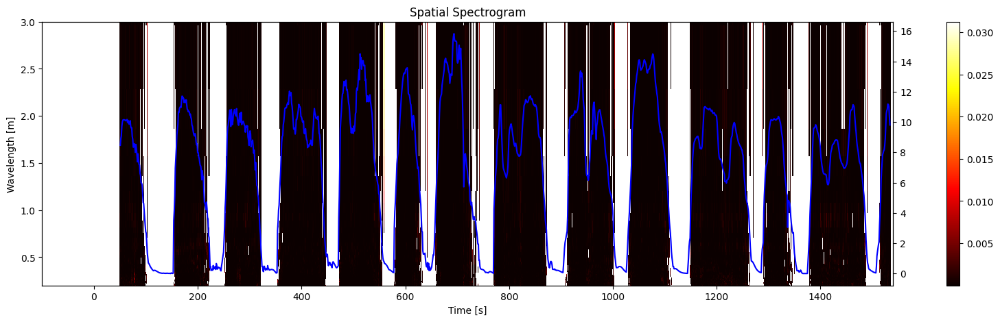

In [194]:
min_wl = 0.2  # meter
max_wl = 10.0  # meter
wllim = (min_wl, max_wl)
fslim = (1/max_wl, 1/min_wl)

def get_spatial_spectrogram(spectrogram: tuple, tv: np.ndarray, min_wl: float, max_wl: float, v_th_mask: float = 0.0, exponent: float =  4.0) -> tuple:
    reg = 0
    spatial_frequencies = np.linspace(1/max_wl, 1/min_wl, len(spectrogram[0]))
    f, t, Sxx = spectrogram
    Sxx_spatial = 0 * Sxx
    for i, t_ in enumerate(t):
        v = np.interp(t_, tv[:,0], tv[:,1])
        if v >= v_th_mask:
            Sxx_spatial[:, i] = np.interp(v*spatial_frequencies, f, Sxx[:, i])/((v+reg)**exponent)
        else:
            Sxx_spatial[:, i] = np.interp(v*spatial_frequencies, f, Sxx[:, i])/((v+1)**exponent) * np.nan
    return spatial_frequencies, t, Sxx_spatial

spatial_spectrogram_in = get_spatial_spectrogram(
    spectrogram_in_mean, loc_orig_df[['seconds_elapsed', 'speed']].values, 
    min_wl, max_wl,
    exponent=4, v_th_mask=v_th_mask)

# Plots
# ax = plot_spectrogram(spatial_spectrogram_in, tlim=tlim, title='Spatial Spectrogram', spatial=True, flim=fslim)
ax = plot_spectrogram((1/spatial_spectrogram_in[0], spatial_spectrogram_in[1], spatial_spectrogram_in[2]), 
                      tlim=tlim, title='Spatial Spectrogram', spatial=True, period=True, flim=(wllim[0], 3))
ax_twin = ax.twinx()
ax_twin.plot(loc_orig_df['seconds_elapsed'], loc_orig_df['speed'], color='blue', label='speed 1')
ax_twin.set_xlim(tlim)

{'inter_sleepers=0.601m': 0.601, 'wheel_base=1.8m': 1.8, 'inter_bogie=9m': 9, 'inter_sleepers/2': 0.3005, 'wheel_base/2': 0.9, 'inter_bogie/2': 4.5, '1/(inter_sleepers - 2*(1/wheel_base))': 0.9022518765638031, '1/(inter_sleepers + 2*(1/wheel_base))': 0.45056226572261554, '1/(2inter_sleepers - 2*(1/wheel_base))': 0.3607202400800267, '1/(2inter_sleepers + 2*(1/wheel_base))': 0.25751011663889545}


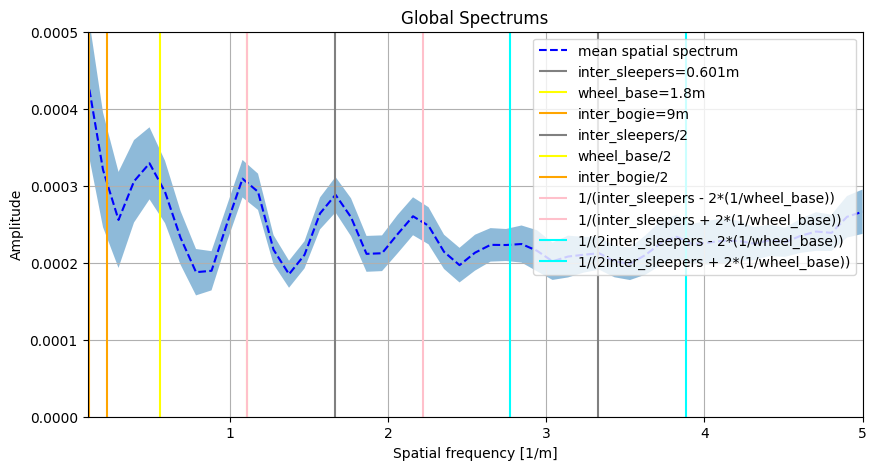

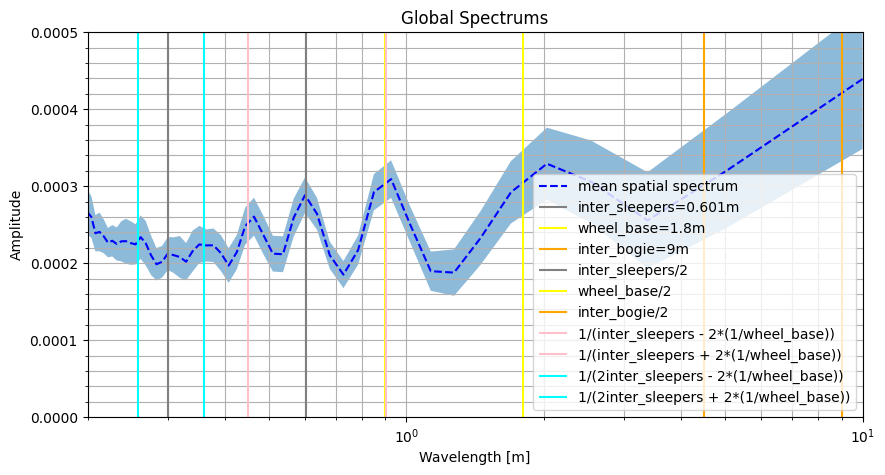

In [197]:
wheel_base = 1.80  # m, taken from https://www.trainweb.us/ctrain/u2actech.html#:~:text=Technical%20Information%20Siemens%20U2%20AC,Rating%20per%20Motor
inter_sleepers = 0.601  # m, measured with google earth
inter_bogie = 9  # m, (35.09/7.04)*wheel_base,  # m, measured relatively from https://en.wikipedia.org/wiki/Siemens%E2%80%93Duewag_U2
separations = {
    f'{inter_sleepers=}m': inter_sleepers,
    f'{wheel_base=}m': wheel_base,
    f'{inter_bogie=}m': inter_bogie,
    'inter_sleepers/2': inter_sleepers/2,
    'wheel_base/2': wheel_base/2,
    'inter_bogie/2': inter_bogie/2,
    '1/(inter_sleepers - 2*(1/wheel_base))': 1/(1/inter_sleepers - (1/wheel_base)),
    '1/(inter_sleepers + 2*(1/wheel_base))': 1/(1/inter_sleepers + (1/wheel_base)),
    '1/(2inter_sleepers - 2*(1/wheel_base))': 1/(2/inter_sleepers - (1/wheel_base)),
    '1/(2inter_sleepers + 2*(1/wheel_base))': 1/(2/inter_sleepers + (1/wheel_base)),
}

print(separations)

ylim = .00000, .0005

colors = ['gray', 'yellow', 'orange', 'gray', 'yellow', 'orange', 'pink', 'pink', 'cyan', 'cyan']

# Global of FRF normalized - velocity normalized - spatial spectrum
f, t, Sxx = spatial_spectrogram_in
global_spatial_spectrum_mean = np.nanmean(Sxx, axis=1)
# global_spatial_spectrum_median = np.nanmedian(Sxx, axis=1)
global_spatial_spectrum_mse = np.nanstd(Sxx, axis=1)/np.sqrt(len(t))
global_spatial_spectrum_u = global_spatial_spectrum_mean +1.96*global_spatial_spectrum_mse
global_spatial_spectrum_l = global_spatial_spectrum_mean -1.96*global_spatial_spectrum_mse


# Plot Global of FRF normalized - velocity normalized - spatial spectrum
fig, ax = plt.subplots(figsize=(10, 5))
# ax.set_yscale('log')
# ax.set_xscale('log')
ax.plot(f, global_spatial_spectrum_mean, label='mean spatial spectrum', color='blue', linestyle='--')
# ax.plot(f, global_spatial_spectrum_median, label='median spatial spectrum', color='blue')
ax.fill_between(f, global_spatial_spectrum_l, global_spatial_spectrum_u, alpha=0.5)
ax.set_title('Global Spectrums')
ax.set_xlabel('Spatial frequency [1/m]')
ax.set_ylabel('Amplitude')
ax.set_xlim((1/wllim[1], 1/wllim[0]))
ax.set_ylim(ylim)
ax.grid(which='both')

for color, key in zip(colors, separations.keys()):
    ax.vlines(1/separations[key], 0, np.max(global_spatial_spectrum_u), color=color, label=key)
    
ax.legend(loc='upper right')


# The same, but in terms of wavelength
wavelengths = 1 / f
# Plot Global of FRF normalized - velocity normalized - spatial spectrum in terms of wavelength
fig, ax_ = plt.subplots(figsize=(10, 5))
ax_.set_xscale('log')
ax_.plot(wavelengths, global_spatial_spectrum_mean, label='mean spatial spectrum', color='blue', linestyle='--')
# ax_.plot(wavelengths, global_spatial_spectrum_median, label='median spatial spectrum', color='blue')
ax_.fill_between(wavelengths, global_spatial_spectrum_l, global_spatial_spectrum_u, alpha=0.5)
ax_.set_title('Global Spectrums')
ax_.set_xlabel('Wavelength [m]')
ax_.set_ylabel('Amplitude')
ax_.set_ylim(ylim)
ax_.set_xlim(wllim)
ax_.minorticks_on()

for color, key in zip(colors, separations.keys()):
    ax_.vlines(separations[key], 0, np.max(global_spatial_spectrum_u), color=color, label=key)
  
ax_.grid(which='both')
ax_.legend()

plt.show()